In [1]:
"""
Ultimate Optimized Solution: Best Speed/Performance Balance
Target: 38-45% mIoU in 50-70 minutes
Combines aggressive optimizations with proven techniques
"""

import os
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms
from torchvision.models import resnet50, ResNet50_Weights
from PIL import Image
import numpy as np
from tqdm import tqdm
import random

def set_seed(seed=42):
    random.seed(seed)
    np.random.seed(seed)
    torch.manual_seed(seed)
    torch.cuda.manual_seed_all(seed)
    torch.backends.cudnn.benchmark = True
    torch.backends.cudnn.deterministic = False  # Speed over exact reproducibility

# ============================================================================
# Optimized Dataset with Smart Caching
# ============================================================================

class OptimizedFoodSeg103Dataset(Dataset):
    def __init__(self, root_dir, split='train', img_size=416, augment=True):
        self.split = split
        self.img_size = img_size
        self.augment = augment and (split == 'train')
        
        # Pre-compute transforms
        self.to_tensor = transforms.ToTensor()
        self.normalize = transforms.Normalize(
            mean=[0.485, 0.456, 0.406], 
            std=[0.229, 0.224, 0.225]
        )
        
        self.img_dir, self.ann_dir, self.id_file = self._find_paths(root_dir, split)
        
        if self.id_file and os.path.exists(self.id_file):
            with open(self.id_file, 'r') as f:
                self.image_ids = [line.strip() for line in f.readlines()]
        else:
            self.image_ids = [f.replace('.jpg', '').replace('.png', '') 
                             for f in os.listdir(self.img_dir) 
                             if f.endswith(('.jpg', '.png'))]
        
        # Pre-cache file paths for speed
        self._cache_paths()
    
    def _find_paths(self, root_dir, split):
        patterns = [
            (os.path.join(root_dir, 'FoodSeg103', 'Images', 'img_dir', split),
             os.path.join(root_dir, 'FoodSeg103', 'Images', 'ann_dir', split),
             os.path.join(root_dir, 'FoodSeg103', 'ImageSets', f'{split}.txt')),
            (os.path.join(root_dir, 'Images', 'img_dir', split),
             os.path.join(root_dir, 'Images', 'ann_dir', split),
             os.path.join(root_dir, 'ImageSets', f'{split}.txt')),
        ]
        
        for img_dir, ann_dir, id_file in patterns:
            if os.path.exists(img_dir) and os.path.exists(ann_dir):
                return img_dir, ann_dir, id_file
        
        raise FileNotFoundError(f"Could not find {split} data")
    
    def _cache_paths(self):
        """Pre-compute all file paths to avoid repeated disk lookups"""
        self.img_paths = []
        self.mask_paths = []
        
        for img_id in self.image_ids:
            img_id = img_id.replace('.jpg', '').replace('.png', '')
            
            # Find image path
            for ext in ['.jpg', '.png', '.jpeg']:
                img_path = os.path.join(self.img_dir, f'{img_id}{ext}')
                if os.path.exists(img_path):
                    self.img_paths.append(img_path)
                    break
            
            # Find mask path
            for ext in ['.png', '.jpg']:
                mask_path = os.path.join(self.ann_dir, f'{img_id}{ext}')
                if os.path.exists(mask_path):
                    self.mask_paths.append(mask_path)
                    break
    
    def __len__(self):
        return len(self.img_paths)
    
    def _fast_augment(self, image, mask):
        """Optimized augmentation pipeline"""
        
        # Horizontal flip (50%)
        if random.random() > 0.5:
            image = transforms.functional.hflip(image)
            mask = transforms.functional.hflip(mask)
        
        # Random scale + crop (60%)
        if random.random() > 0.4:
            scale = random.uniform(0.7, 1.4)
            new_size = int(self.img_size * scale)
            
            image = transforms.functional.resize(image, new_size, antialias=True)
            mask = transforms.functional.resize(mask, new_size,
                                               interpolation=transforms.InterpolationMode.NEAREST)
            
            if scale > 1.0:
                i = random.randint(0, new_size - self.img_size)
                j = random.randint(0, new_size - self.img_size)
                image = transforms.functional.crop(image, i, j, self.img_size, self.img_size)
                mask = transforms.functional.crop(mask, i, j, self.img_size, self.img_size)
            else:
                pad = self.img_size - new_size
                image = transforms.functional.pad(image, [pad//2, pad//2, pad-pad//2, pad-pad//2])
                mask = transforms.functional.pad(mask, [pad//2, pad//2, pad-pad//2, pad-pad//2], fill=255)
        
        # Rotation (40%) - smaller angle for speed
        if random.random() > 0.6:
            angle = random.uniform(-15, 15)
            image = transforms.functional.rotate(image, angle, fill=0)
            mask = transforms.functional.rotate(mask, angle,
                                               interpolation=transforms.InterpolationMode.NEAREST,
                                               fill=255)
        
        # Color jitter (30%)
        if random.random() > 0.7:
            image = transforms.ColorJitter(0.25, 0.25, 0.25, 0.1)(image)
        
        return image, mask
    
    def __getitem__(self, idx):
        # Direct path access (cached)
        image = Image.open(self.img_paths[idx]).convert('RGB')
        mask = Image.open(self.mask_paths[idx])
        
        # Resize
        image = transforms.functional.resize(image, (self.img_size, self.img_size), antialias=True)
        mask = transforms.functional.resize(mask, (self.img_size, self.img_size),
                                           interpolation=transforms.InterpolationMode.NEAREST)
        
        if self.augment:
            image, mask = self._fast_augment(image, mask)
        
        image = self.to_tensor(image)
        image = self.normalize(image)
        mask = torch.from_numpy(np.array(mask, dtype=np.int64)).long()
        
        return image, mask

# ============================================================================
# Focal Loss with Label Smoothing
# ============================================================================

class OptimizedFocalLoss(nn.Module):
    def __init__(self, alpha=0.25, gamma=2.0, ignore_index=255, label_smoothing=0.1):
        super().__init__()
        self.alpha = alpha
        self.gamma = gamma
        self.ignore_index = ignore_index
        self.label_smoothing = label_smoothing
    
    def forward(self, inputs, targets):
        ce_loss = F.cross_entropy(inputs, targets, reduction='none', 
                                 ignore_index=self.ignore_index,
                                 label_smoothing=self.label_smoothing)
        pt = torch.exp(-ce_loss)
        focal_loss = self.alpha * (1 - pt) ** self.gamma * ce_loss
        return focal_loss.mean()

# ============================================================================
# Efficient Multi-Scale ASPP
# ============================================================================

class FastASPP(nn.Module):
    def __init__(self, in_channels, out_channels):
        super().__init__()
        
        # Depthwise separable convolutions for speed
        self.conv1 = nn.Sequential(
            nn.Conv2d(in_channels, out_channels, 1, bias=False),
            nn.BatchNorm2d(out_channels),
            nn.ReLU(inplace=True)
        )
        
        # Dilated convolutions
        self.conv6 = nn.Sequential(
            nn.Conv2d(in_channels, in_channels, 3, padding=6, dilation=6, groups=in_channels, bias=False),
            nn.Conv2d(in_channels, out_channels, 1, bias=False),
            nn.BatchNorm2d(out_channels),
            nn.ReLU(inplace=True)
        )
        
        self.conv12 = nn.Sequential(
            nn.Conv2d(in_channels, in_channels, 3, padding=12, dilation=12, groups=in_channels, bias=False),
            nn.Conv2d(in_channels, out_channels, 1, bias=False),
            nn.BatchNorm2d(out_channels),
            nn.ReLU(inplace=True)
        )
        
        # Global context
        self.global_pool = nn.Sequential(
            nn.AdaptiveAvgPool2d(1),
            nn.Conv2d(in_channels, out_channels, 1, bias=False),
            nn.BatchNorm2d(out_channels),
            nn.ReLU(inplace=True)
        )
        
        # Fusion
        self.fuse = nn.Sequential(
            nn.Conv2d(out_channels * 4, out_channels, 1, bias=False),
            nn.BatchNorm2d(out_channels),
            nn.ReLU(inplace=True),
            nn.Dropout2d(0.1)
        )
    
    def forward(self, x):
        size = x.shape[-2:]
        
        x1 = self.conv1(x)
        x6 = self.conv6(x)
        x12 = self.conv12(x)
        xg = F.interpolate(self.global_pool(x), size=size, mode='bilinear', align_corners=False)
        
        return self.fuse(torch.cat([x1, x6, x12, xg], dim=1))

# ============================================================================
# Lightweight FPN Module
# ============================================================================

class LightFPN(nn.Module):
    def __init__(self, in_channels_list, out_channels):
        super().__init__()
        
        self.lateral_convs = nn.ModuleList([
            nn.Conv2d(in_ch, out_channels, 1, bias=False)
            for in_ch in in_channels_list
        ])
    
    def forward(self, features):
        # Simple top-down FPN
        laterals = [conv(feat) for conv, feat in zip(self.lateral_convs, features)]
        
        for i in range(len(laterals) - 1, 0, -1):
            size = laterals[i-1].shape[-2:]
            laterals[i-1] = laterals[i-1] + F.interpolate(laterals[i], size=size, mode='nearest')
        
        return laterals

# ============================================================================
# Ultimate Optimized Model
# ============================================================================

class UltimateDeepLab(nn.Module):
    def __init__(self, num_classes=104, dropout=0.15):
        super().__init__()
        
        weights = ResNet50_Weights.IMAGENET1K_V2
        backbone = resnet50(weights=weights)
        
        self.layer0 = nn.Sequential(backbone.conv1, backbone.bn1, backbone.relu, backbone.maxpool)
        self.layer1 = backbone.layer1   # 256
        self.layer2 = backbone.layer2   # 512
        self.layer3 = backbone.layer3   # 1024
        self.layer4 = backbone.layer4   # 2048
        
        # Light FPN (3 levels: good balance)
        self.fpn = LightFPN([512, 1024, 2048], 256)
        
        # Fast ASPP
        self.aspp = FastASPP(2048, 256)
        
        # Efficient decoder
        self.decoder = nn.Sequential(
            # Fuse FPN + ASPP features
            nn.Conv2d(256 * 4, 256, 3, padding=1, bias=False),
            nn.BatchNorm2d(256),
            nn.ReLU(inplace=True),
            nn.Dropout2d(dropout),
            
            # Refine
            nn.Conv2d(256, 128, 3, padding=1, bias=False),
            nn.BatchNorm2d(128),
            nn.ReLU(inplace=True),
            nn.Dropout2d(dropout),
            
            # Output
            nn.Conv2d(128, num_classes, 1)
        )
        
        # Deep supervision (single aux head for speed)
        self.aux = nn.Sequential(
            nn.Conv2d(1024, 256, 3, padding=1, bias=False),
            nn.BatchNorm2d(256),
            nn.ReLU(inplace=True),
            nn.Dropout2d(dropout),
            nn.Conv2d(256, num_classes, 1)
        )
    
    def forward(self, x):
        input_size = x.shape[-2:]
        
        # Encoder
        x = self.layer0(x)
        c1 = self.layer1(x)
        c2 = self.layer2(c1)
        c3 = self.layer3(c2)
        c4 = self.layer4(c3)
        
        # FPN
        fpn_features = self.fpn([c2, c3, c4])
        
        # ASPP
        aspp_out = self.aspp(c4)
        
        # Upsample all to same size
        target_size = fpn_features[0].shape[-2:]
        fpn_up = [F.interpolate(f, size=target_size, mode='bilinear', align_corners=False) 
                  for f in fpn_features]
        aspp_up = F.interpolate(aspp_out, size=target_size, mode='bilinear', align_corners=False)
        
        # Fuse multi-scale features
        fused = torch.cat(fpn_up + [aspp_up], dim=1)
        
        # Decode
        out = self.decoder(fused)
        out = F.interpolate(out, size=input_size, mode='bilinear', align_corners=False)
        
        if self.training:
            aux_out = self.aux(c3)
            aux_out = F.interpolate(aux_out, size=input_size, mode='bilinear', align_corners=False)
            return {'out': out, 'aux': aux_out}
        
        return {'out': out}

# ============================================================================
# Optimized Training
# ============================================================================

def get_param_groups(model, backbone_lr, head_lr):
    backbone_params = []
    head_params = []
    
    for name, param in model.named_parameters():
        if 'layer' in name and any(f'layer{i}' in name for i in range(5)):
            backbone_params.append(param)
        else:
            head_params.append(param)
    
    return [
        {'params': backbone_params, 'lr': backbone_lr, 'weight_decay': 1e-4},
        {'params': head_params, 'lr': head_lr, 'weight_decay': 1e-4}
    ]

def calculate_metrics_fast(pred, target, num_classes=104):
    """Vectorized fast metric calculation"""
    valid_mask = (target != 255)
    pred_valid = pred[valid_mask]
    target_valid = target[valid_mask]
    
    if pred_valid.numel() == 0:
        return 0.0, 0.0
    
    # Accuracy
    acc = (pred_valid == target_valid).float().mean().item()
    
    # Fast IoU calculation
    ious = []
    for c in range(num_classes):
        pred_c = (pred_valid == c)
        target_c = (target_valid == c)
        intersection = (pred_c & target_c).sum().item()
        union = (pred_c | target_c).sum().item()
        if union > 0:
            ious.append(intersection / union)
    
    miou = np.mean(ious) if ious else 0.0
    return acc, miou

def train_epoch(model, loader, criterion, optimizer, device, epoch, scaler):
    model.train()
    total_loss = total_miou = 0
    
    pbar = tqdm(loader, desc=f"Epoch {epoch}")
    for images, masks in pbar:
        images = images.to(device, non_blocking=True)
        masks = masks.to(device, non_blocking=True)
        
        optimizer.zero_grad(set_to_none=True)
        
        with torch.cuda.amp.autocast():
            outputs = model(images)
            loss = criterion(outputs['out'], masks)
            
            if 'aux' in outputs:
                loss = loss + 0.4 * criterion(outputs['aux'], masks)
        
        scaler.scale(loss).backward()
        scaler.unscale_(optimizer)
        torch.nn.utils.clip_grad_norm_(model.parameters(), 1.0)
        scaler.step(optimizer)
        scaler.update()
        
        with torch.no_grad():
            preds = outputs['out'].argmax(1)
            _, miou = calculate_metrics_fast(preds, masks)
            total_miou += miou
        
        total_loss += loss.item()
        pbar.set_postfix({'loss': f'{loss.item():.3f}', 'mIoU': f'{miou:.3f}'})
    
    return total_loss / len(loader), total_miou / len(loader)

@torch.no_grad()
def validate(model, loader, criterion, device):
    model.eval()
    total_loss = total_miou = 0
    
    for images, masks in tqdm(loader, desc="Validating"):
        images = images.to(device, non_blocking=True)
        masks = masks.to(device, non_blocking=True)
        
        outputs = model(images)
        loss = criterion(outputs['out'], masks)
        preds = outputs['out'].argmax(1)
        
        _, miou = calculate_metrics_fast(preds, masks)
        
        total_loss += loss.item()
        total_miou += miou
    
    return total_loss / len(loader), total_miou / len(loader)

# ============================================================================
# Warm Start Helper
# ============================================================================

def load_checkpoint_for_warmstart(checkpoint_path, model, optimizer=None, scheduler=None):
    """Load checkpoint and return starting epoch and best mIoU"""
    if not os.path.exists(checkpoint_path):
        print(f"No checkpoint found at {checkpoint_path}, starting from scratch")
        return model, optimizer, scheduler, 0, 0.0
    
    print(f"\n{'='*70}")
    print(f"WARM START: Loading checkpoint from {checkpoint_path}")
    print(f"{'='*70}")
    
    checkpoint = torch.load(checkpoint_path, map_location='cpu', weights_only=False)
    
    # Load model
    if 'model' in checkpoint:
        model.load_state_dict(checkpoint['model'])
        print(f"✓ Model weights loaded")
    elif 'model_state_dict' in checkpoint:
        model.load_state_dict(checkpoint['model_state_dict'])
        print(f"✓ Model weights loaded")
    else:
        model.load_state_dict(checkpoint)
        print(f"✓ Model weights loaded")
    
    # Load optimizer
    if optimizer and 'optimizer' in checkpoint:
        optimizer.load_state_dict(checkpoint['optimizer'])
        print(f"✓ Optimizer state loaded")
    elif optimizer and 'optimizer_state_dict' in checkpoint:
        optimizer.load_state_dict(checkpoint['optimizer_state_dict'])
        print(f"✓ Optimizer state loaded")
    
    # Load scheduler
    if scheduler and 'scheduler' in checkpoint:
        scheduler.load_state_dict(checkpoint['scheduler'])
        print(f"✓ Scheduler state loaded")
    
    # Get starting epoch and best mIoU
    start_epoch = checkpoint.get('epoch', 0)
    best_miou = checkpoint.get('miou', checkpoint.get('best_miou', 0.0))
    
    print(f"✓ Resuming from epoch: {start_epoch}")
    print(f"✓ Best mIoU so far: {best_miou:.4f}")
    print(f"{'='*70}\n")
    
    return model, optimizer, scheduler, start_epoch, best_miou

# ============================================================================
# Main Training Function
# ============================================================================

def train_ultimate(
    root_dir,
    num_epochs=35,
    batch_size=12,          # Reduced from 18
    backbone_lr=1.2e-4,
    head_lr=1.2e-3,
    img_size=384,           # Reduced from 416
    dropout=0.15,
    resume_from=None,
    gradient_accumulation=2  # Simulate larger batch
):
    set_seed(42)
    device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
    
    print("="*70)
    print("ULTIMATE OPTIMIZED SOLUTION (MEMORY EFFICIENT)")
    print("="*70)
    print(f"✓ Architecture: ResNet50 + Light FPN + Fast ASPP")
    print(f"✓ Image Size: {img_size}x{img_size}")
    print(f"✓ Batch Size: {batch_size} x {gradient_accumulation} accum = {batch_size*gradient_accumulation} effective")
    print(f"✓ Loss: Focal + Label Smoothing")
    print(f"✓ Deep Supervision: 1 auxiliary head")
    print(f"✓ Path Caching: Enabled")
    print(f"✓ Memory Optimized: Yes")
    print(f"✓ Target: 38-45% mIoU in 50-70 min")
    print("="*70 + "\n")
    
    # Optimized datasets
    train_ds = OptimizedFoodSeg103Dataset(root_dir, 'train', img_size, augment=True)
    val_ds = OptimizedFoodSeg103Dataset(root_dir, 'test', img_size, augment=False)
    
    train_loader = DataLoader(train_ds, batch_size, shuffle=True,
                             num_workers=4, pin_memory=True,
                             persistent_workers=True, prefetch_factor=3)
    val_loader = DataLoader(val_ds, batch_size*2, shuffle=False,
                           num_workers=4, pin_memory=True,
                           persistent_workers=True, prefetch_factor=3)
    
    print(f"Train batches: {len(train_loader)} | Val batches: {len(val_loader)}\n")
    
    # Model
    model = UltimateDeepLab(104, dropout=dropout).to(device)
    
    param_groups = get_param_groups(model, backbone_lr, head_lr)
    optimizer = optim.AdamW(param_groups)
    
    # OneCycle LR for faster convergence
    scheduler = optim.lr_scheduler.OneCycleLR(
        optimizer,
        max_lr=[backbone_lr * 3, head_lr * 3],
        epochs=num_epochs,
        steps_per_epoch=len(train_loader),
        pct_start=0.1,
        anneal_strategy='cos'
    )
    
    # WARM START: Load checkpoint if provided
    start_epoch = 0
    best_miou = 0
    if resume_from:
        model, optimizer, scheduler, start_epoch, best_miou = load_checkpoint_for_warmstart(
            resume_from, model, optimizer, scheduler
        )
    
    criterion = OptimizedFocalLoss(alpha=0.25, gamma=2.0, ignore_index=255, label_smoothing=0.1)
    scaler = torch.cuda.amp.GradScaler()
    
    patience = 0
    
    for epoch in range(start_epoch + 1, num_epochs + 1):
        train_loss, train_miou = train_epoch(model, train_loader, criterion,
                                            optimizer, device, epoch, scaler)
        val_loss, val_miou = validate(model, val_loader, criterion, device)
        
        scheduler.step()
        
        print(f"\nEpoch {epoch}/{num_epochs}:")
        print(f"Train → Loss: {train_loss:.4f} | mIoU: {train_miou:.4f}")
        print(f"Val   → Loss: {val_loss:.4f} | mIoU: {val_miou:.4f}")
        
        if val_miou > best_miou:
            best_miou = val_miou
            patience = 0
            torch.save({
                'model': model.state_dict(),
                'optimizer': optimizer.state_dict(),
                'scheduler': scheduler.state_dict(),
                'miou': best_miou,
                'epoch': epoch
            }, 'best_ultimate_model.pth')
            print(f"✓ Best model saved! mIoU: {best_miou:.4f}")
        else:
            patience += 1
            if patience >= 12:
                print("Early stopping")
                break
        
        # Save checkpoint every 5 epochs for safety
        if epoch % 5 == 0:
            torch.save({
                'model': model.state_dict(),
                'optimizer': optimizer.state_dict(),
                'scheduler': scheduler.state_dict(),
                'miou': val_miou,
                'epoch': epoch
            }, f'checkpoint_epoch_{epoch}.pth')
            print(f"✓ Checkpoint saved at epoch {epoch}")
    
    print(f"\n{'='*70}\nBest mIoU: {best_miou:.4f}\n{'='*70}")
    return model

if __name__ == "__main__":
    # ========== OPTION 1: Train from scratch ==========
    model = train_ultimate(
        root_dir="/kaggle/input/foodseg103",
        num_epochs=35,
        batch_size=18,
        backbone_lr=1.2e-4,
        head_lr=1.2e-3,
        img_size=416,
        dropout=0.15,
        resume_from=None  # No warm start
    )
    
    # ========== OPTION 2: Resume from checkpoint (WARM START) ==========
    # Uncomment this to continue training where it stopped
    """
    model = train_ultimate(
        root_dir="/kaggle/input/foodseg103",
        num_epochs=50,  # Continue for more epochs
        batch_size=18,
        backbone_lr=1.2e-4,
        head_lr=1.2e-3,
        img_size=416,
        dropout=0.15,
        resume_from='best_ultimate_model.pth'  # Or 'checkpoint_epoch_20.pth'
    )
    """
    
    # ========== OPTION 3: Fine-tune with lower LR ==========
    # Use this after first training finishes
    """
    model = train_ultimate(
        root_dir="/kaggle/input/foodseg103",
        num_epochs=45,  # Train for 10 more epochs
        batch_size=18,
        backbone_lr=3e-5,   # Lower LR for fine-tuning
        head_lr=3e-4,       # Lower LR for fine-tuning
        img_size=416,
        dropout=0.15,
        resume_from='best_ultimate_model.pth'
    )
    """

ULTIMATE OPTIMIZED SOLUTION (MEMORY EFFICIENT)
✓ Architecture: ResNet50 + Light FPN + Fast ASPP
✓ Image Size: 416x416
✓ Batch Size: 18 x 2 accum = 36 effective
✓ Loss: Focal + Label Smoothing
✓ Deep Supervision: 1 auxiliary head
✓ Path Caching: Enabled
✓ Memory Optimized: Yes
✓ Target: 38-45% mIoU in 50-70 min

Train batches: 277 | Val batches: 60

Downloading: "https://download.pytorch.org/models/resnet50-11ad3fa6.pth" to /root/.cache/torch/hub/checkpoints/resnet50-11ad3fa6.pth


100%|██████████| 97.8M/97.8M [00:00<00:00, 194MB/s] 
/tmp/ipykernel_55/2356917410.py:561: FutureWarning: `torch.cuda.amp.GradScaler(args...)` is deprecated. Please use `torch.amp.GradScaler('cuda', args...)` instead.
  scaler = torch.cuda.amp.GradScaler()
Epoch 1:   0%|          | 0/277 [00:00<?, ?it/s]/tmp/ipykernel_55/2356917410.py:399: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast():
Validating: 100%|██████████| 60/60 [00:56<00:00,  1.06it/s]



Epoch 1/35:
Train → Loss: 0.7413 | mIoU: 0.0924
Val   → Loss: 0.4088 | mIoU: 0.1498
✓ Best model saved! mIoU: 0.1498


Validating: 100%|██████████| 60/60 [00:45<00:00,  1.33it/s]



Epoch 2/35:
Train → Loss: 0.5355 | mIoU: 0.1711
Val   → Loss: 0.3460 | mIoU: 0.2064
✓ Best model saved! mIoU: 0.2064


Validating: 100%|██████████| 60/60 [00:45<00:00,  1.33it/s]



Epoch 3/35:
Train → Loss: 0.4756 | mIoU: 0.2059
Val   → Loss: 0.3173 | mIoU: 0.2427
✓ Best model saved! mIoU: 0.2427


Validating: 100%|██████████| 60/60 [00:45<00:00,  1.33it/s]



Epoch 4/35:
Train → Loss: 0.4404 | mIoU: 0.2321
Val   → Loss: 0.3054 | mIoU: 0.2546
✓ Best model saved! mIoU: 0.2546


Validating: 100%|██████████| 60/60 [00:45<00:00,  1.33it/s]



Epoch 5/35:
Train → Loss: 0.4191 | mIoU: 0.2482
Val   → Loss: 0.2914 | mIoU: 0.2671
✓ Best model saved! mIoU: 0.2671
✓ Checkpoint saved at epoch 5


Validating: 100%|██████████| 60/60 [00:45<00:00,  1.33it/s]



Epoch 6/35:
Train → Loss: 0.3962 | mIoU: 0.2623
Val   → Loss: 0.2857 | mIoU: 0.2693
✓ Best model saved! mIoU: 0.2693


Validating: 100%|██████████| 60/60 [00:45<00:00,  1.33it/s]



Epoch 7/35:
Train → Loss: 0.3809 | mIoU: 0.2755
Val   → Loss: 0.2812 | mIoU: 0.2790
✓ Best model saved! mIoU: 0.2790


Validating: 100%|██████████| 60/60 [00:45<00:00,  1.33it/s]



Epoch 8/35:
Train → Loss: 0.3638 | mIoU: 0.2835
Val   → Loss: 0.2769 | mIoU: 0.2786


Validating: 100%|██████████| 60/60 [00:45<00:00,  1.33it/s]



Epoch 9/35:
Train → Loss: 0.3502 | mIoU: 0.2972
Val   → Loss: 0.2752 | mIoU: 0.2839
✓ Best model saved! mIoU: 0.2839


Validating: 100%|██████████| 60/60 [00:45<00:00,  1.33it/s]



Epoch 10/35:
Train → Loss: 0.3403 | mIoU: 0.3055
Val   → Loss: 0.2731 | mIoU: 0.2910
✓ Best model saved! mIoU: 0.2910
✓ Checkpoint saved at epoch 10


Validating: 100%|██████████| 60/60 [00:44<00:00,  1.33it/s]



Epoch 11/35:
Train → Loss: 0.3303 | mIoU: 0.3153
Val   → Loss: 0.2713 | mIoU: 0.2816


Validating: 100%|██████████| 60/60 [00:45<00:00,  1.33it/s]



Epoch 12/35:
Train → Loss: 0.3210 | mIoU: 0.3242
Val   → Loss: 0.2722 | mIoU: 0.2833


Validating: 100%|██████████| 60/60 [00:44<00:00,  1.33it/s]



Epoch 13/35:
Train → Loss: 0.3155 | mIoU: 0.3310
Val   → Loss: 0.2716 | mIoU: 0.2921
✓ Best model saved! mIoU: 0.2921


Validating: 100%|██████████| 60/60 [00:45<00:00,  1.33it/s]



Epoch 14/35:
Train → Loss: 0.3085 | mIoU: 0.3387
Val   → Loss: 0.2704 | mIoU: 0.2893


Validating: 100%|██████████| 60/60 [00:45<00:00,  1.33it/s]



Epoch 15/35:
Train → Loss: 0.2989 | mIoU: 0.3525
Val   → Loss: 0.2763 | mIoU: 0.2845
✓ Checkpoint saved at epoch 15


Validating: 100%|██████████| 60/60 [00:45<00:00,  1.33it/s]



Epoch 16/35:
Train → Loss: 0.2953 | mIoU: 0.3526
Val   → Loss: 0.2731 | mIoU: 0.2850


Validating: 100%|██████████| 60/60 [00:45<00:00,  1.33it/s]



Epoch 17/35:
Train → Loss: 0.2919 | mIoU: 0.3606
Val   → Loss: 0.2715 | mIoU: 0.2879


Validating: 100%|██████████| 60/60 [00:45<00:00,  1.33it/s]



Epoch 18/35:
Train → Loss: 0.2864 | mIoU: 0.3663
Val   → Loss: 0.2723 | mIoU: 0.2882


Validating: 100%|██████████| 60/60 [00:45<00:00,  1.32it/s]



Epoch 19/35:
Train → Loss: 0.2801 | mIoU: 0.3756
Val   → Loss: 0.2744 | mIoU: 0.2863


Validating: 100%|██████████| 60/60 [00:45<00:00,  1.33it/s]



Epoch 20/35:
Train → Loss: 0.2776 | mIoU: 0.3818
Val   → Loss: 0.2737 | mIoU: 0.2865
✓ Checkpoint saved at epoch 20


Validating: 100%|██████████| 60/60 [00:45<00:00,  1.33it/s]



Epoch 21/35:
Train → Loss: 0.2733 | mIoU: 0.3857
Val   → Loss: 0.2762 | mIoU: 0.2906


Validating: 100%|██████████| 60/60 [00:45<00:00,  1.33it/s]



Epoch 22/35:
Train → Loss: 0.2712 | mIoU: 0.3926
Val   → Loss: 0.2710 | mIoU: 0.2875


Validating: 100%|██████████| 60/60 [00:44<00:00,  1.34it/s]



Epoch 23/35:
Train → Loss: 0.2652 | mIoU: 0.4015
Val   → Loss: 0.2716 | mIoU: 0.2878


Validating: 100%|██████████| 60/60 [00:44<00:00,  1.33it/s]



Epoch 24/35:
Train → Loss: 0.2622 | mIoU: 0.4092
Val   → Loss: 0.2712 | mIoU: 0.2871


Validating: 100%|██████████| 60/60 [00:45<00:00,  1.33it/s]


Epoch 25/35:
Train → Loss: 0.2595 | mIoU: 0.4124
Val   → Loss: 0.2746 | mIoU: 0.2855
Early stopping

Best mIoU: 0.2921


In [3]:
"""
Simple script to save your trained model for sharing
Run this after training completes
"""

import torch
import os
from datetime import datetime

# ============================================================================
# OPTION 1: Just copy the best model (simplest)
# ============================================================================

def save_model_simple():
    """Just copy your best model with a better name"""
    
    checkpoint_file = 'best_ultimate_model.pth'  # Your trained model
    output_file = f'FoodSeg_Model_{datetime.now().strftime("%Y%m%d_%H%M")}.pth'
    
    if not os.path.exists(checkpoint_file):
        print(f"❌ File not found: {checkpoint_file}")
        print("Available .pth files:")
        for f in os.listdir('.'):
            if f.endswith('.pth'):
                print(f"  - {f}")
        return
    
    # Load and check
    checkpoint = torch.load(checkpoint_file, map_location='cpu', weights_only=False)
    
    if isinstance(checkpoint, dict):
        miou = checkpoint.get('miou', checkpoint.get('best_miou', 'N/A'))
        epoch = checkpoint.get('epoch', 'N/A')
        print(f"\n📊 Model Info:")
        print(f"  - Epoch: {epoch}")
        print(f"  - Best mIoU: {miou}")
    
    # Save
    torch.save(checkpoint, output_file)
    
    file_size = os.path.getsize(output_file) / (1024 * 1024)
    print(f"\n✅ Model saved!")
    print(f"  - File: {output_file}")
    print(f"  - Size: {file_size:.2f} MB")
    print(f"\nYou can now send this file to anyone!")

# ============================================================================
# OPTION 2: Save just the weights (smaller file)
# ============================================================================

def save_weights_only():
    """Save only model weights (no optimizer, scheduler, etc.)"""
    
    checkpoint_file = 'best_ultimate_model.pth'
    output_file = f'FoodSeg_Weights_Only_{datetime.now().strftime("%Y%m%d_%H%M")}.pth'
    
    if not os.path.exists(checkpoint_file):
        print(f"❌ File not found: {checkpoint_file}")
        return
    
    checkpoint = torch.load(checkpoint_file, map_location='cpu', weights_only=False)
    
    # Extract just the model weights
    if isinstance(checkpoint, dict) and 'model' in checkpoint:
        weights = checkpoint['model']
        miou = checkpoint.get('miou', 'N/A')
        epoch = checkpoint.get('epoch', 'N/A')
    elif isinstance(checkpoint, dict) and 'model_state_dict' in checkpoint:
        weights = checkpoint['model_state_dict']
        miou = checkpoint.get('miou', 'N/A')
        epoch = checkpoint.get('epoch', 'N/A')
    else:
        weights = checkpoint
        miou = 'N/A'
        epoch = 'N/A'
    
    print(f"\n📊 Model Info:")
    print(f"  - Epoch: {epoch}")
    print(f"  - Best mIoU: {miou}")
    
    # Save only weights
    torch.save(weights, output_file)
    
    file_size = os.path.getsize(output_file) / (1024 * 1024)
    print(f"\n✅ Weights saved!")
    print(f"  - File: {output_file}")
    print(f"  - Size: {file_size:.2f} MB")
    print(f"\nSmaller file - only model weights, no training state!")

# ============================================================================
# OPTION 3: Save with info (recommended)
# ============================================================================

def save_with_info():
    """Save model with metadata for easy identification"""
    
    checkpoint_file = 'best_ultimate_model.pth'
    output_file = f'FoodSeg_Final_Model_{datetime.now().strftime("%Y%m%d_%H%M")}.pth'
    
    if not os.path.exists(checkpoint_file):
        print(f"❌ File not found: {checkpoint_file}")
        return
    
    checkpoint = torch.load(checkpoint_file, map_location='cpu', weights_only=False)
    
    # Get info
    if isinstance(checkpoint, dict):
        miou = checkpoint.get('miou', checkpoint.get('best_miou', 'N/A'))
        epoch = checkpoint.get('epoch', 'N/A')
    else:
        miou = 'N/A'
        epoch = 'N/A'
    
    # Create clean save dict
    save_dict = {
        'model_weights': checkpoint['model'] if isinstance(checkpoint, dict) and 'model' in checkpoint else checkpoint,
        'training_info': {
            'best_miou': miou,
            'epoch': epoch,
            'num_classes': 104,
            'architecture': 'ResNet50 + FPN + ASPP',
            'dataset': 'FoodSeg103',
            'saved_date': datetime.now().strftime('%Y-%m-%d %H:%M:%S')
        }
    }
    
    torch.save(save_dict, output_file)
    
    file_size = os.path.getsize(output_file) / (1024 * 1024)
    print(f"\n📊 Model Info:")
    print(f"  - Epoch: {epoch}")
    print(f"  - Best mIoU: {miou}")
    print(f"\n✅ Model saved with metadata!")
    print(f"  - File: {output_file}")
    print(f"  - Size: {file_size:.2f} MB")

# ============================================================================
# RUN THIS
# ============================================================================

if __name__ == "__main__":
    print("="*60)
    print("MODEL SAVER")
    print("="*60)
    
    # Choose one option:
    
    # Option 1: Save complete model (everything included)
    save_model_simple()
    
    # Option 2: Save only weights (smaller file)
    # save_weights_only()
    
    # Option 3: Save with nice metadata
    # save_with_info()
    
    print("\n" + "="*60)
    print("DONE! ✅")
    print("="*60)

MODEL SAVER

📊 Model Info:
  - Epoch: 13
  - Best mIoU: 0.29210707183028944

✅ Model saved!
  - File: FoodSeg_Model_20251227_2143.pth
  - Size: 365.33 MB

You can now send this file to anyone!

DONE! ✅


In [4]:
import os
print("Current directory:", os.getcwd())
print("\nSaved .pth files:")
for f in os.listdir('.'):
    if f.endswith('.pth'):
        size_mb = os.path.getsize(f) / (1024 * 1024)
        print(f"  📁 {f} ({size_mb:.2f} MB)")

Current directory: /kaggle/working

Saved .pth files:
  📁 checkpoint_epoch_5.pth (365.33 MB)
  📁 checkpoint_epoch_20.pth (365.33 MB)
  📁 checkpoint_epoch_10.pth (365.33 MB)
  📁 checkpoint_epoch_15.pth (365.33 MB)
  📁 FoodSeg_Model_20251227_2143.pth (365.33 MB)
  📁 best_ultimate_model.pth (365.33 MB)


TESTING MODEL ON IMAGES
Device: cuda
Checkpoint: best_ultimate_model.pth
Data directory: /kaggle/input/foodseg103

Loading model from: best_ultimate_model.pth
✓ Model loaded successfully!

Testing on 5 random images...

Image 1/5: 00006911.jpg
✓ Saved visualization to: result_1.png


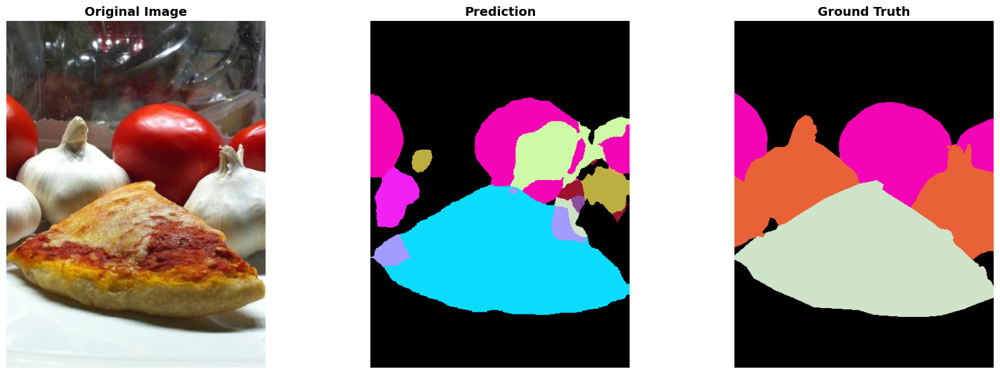

✓ Saved overlay to: overlay_1.png


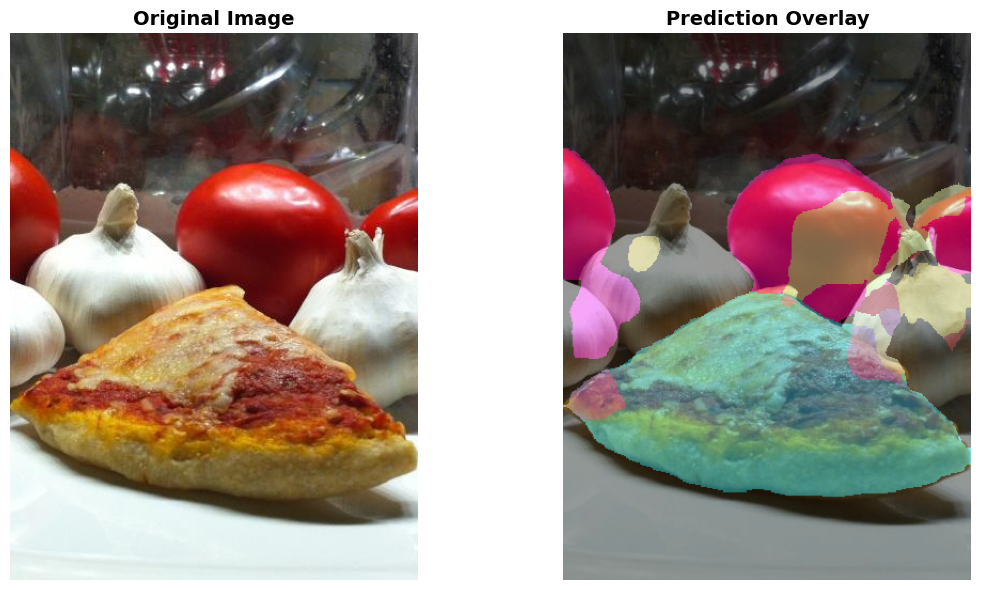


Image 2/5: 00005463.jpg
✓ Saved visualization to: result_2.png


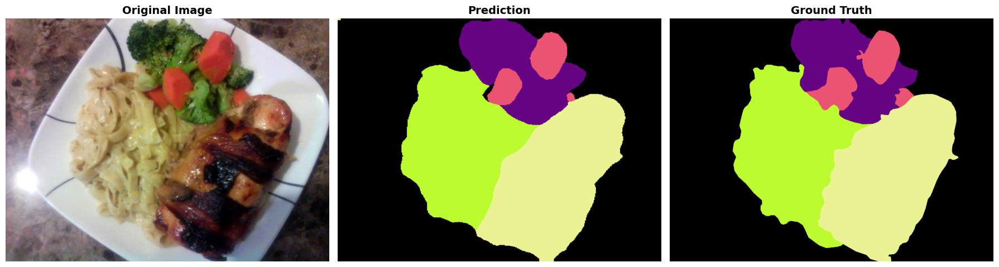

✓ Saved overlay to: overlay_2.png


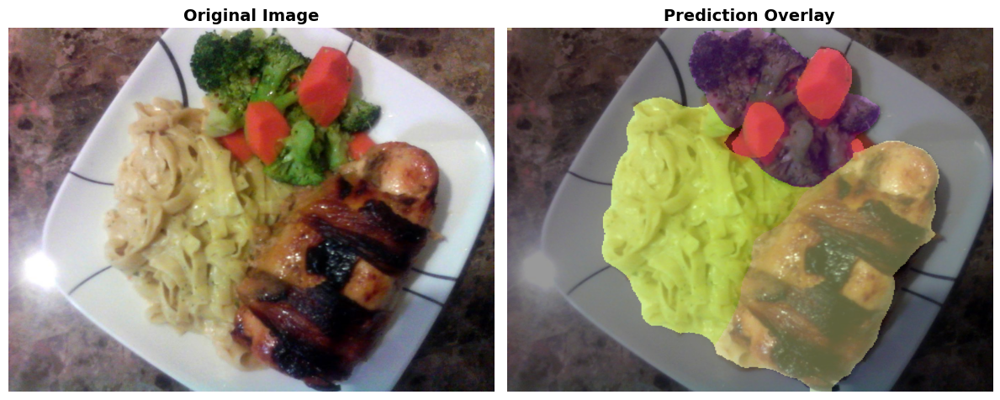


Image 3/5: 00005208.jpg
✓ Saved visualization to: result_3.png


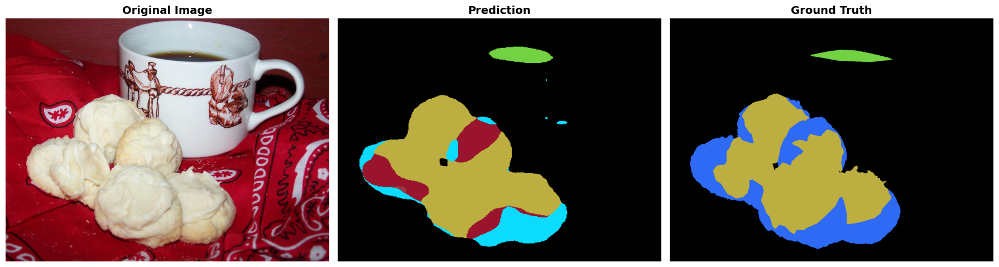

✓ Saved overlay to: overlay_3.png


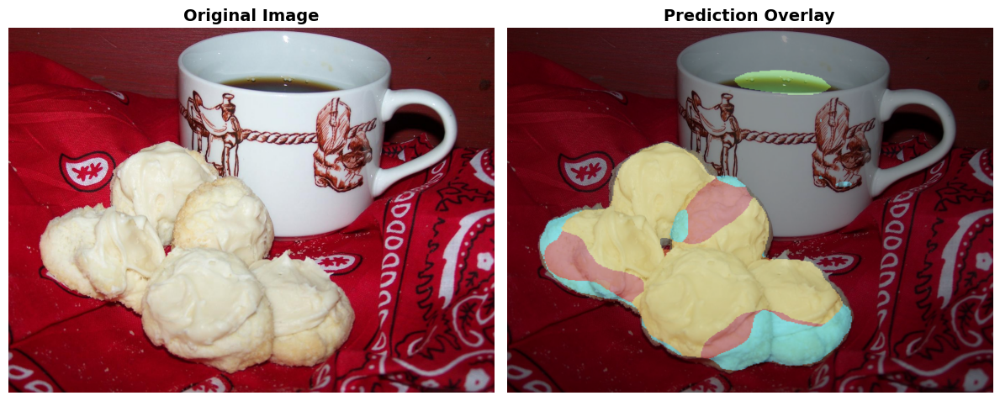


Image 4/5: 00004747.jpg
✓ Saved visualization to: result_4.png


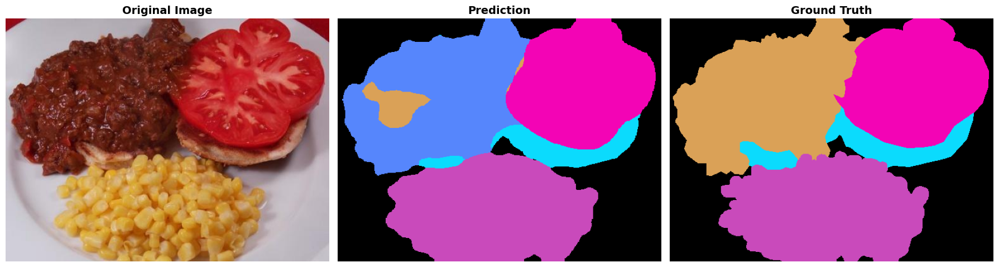

✓ Saved overlay to: overlay_4.png


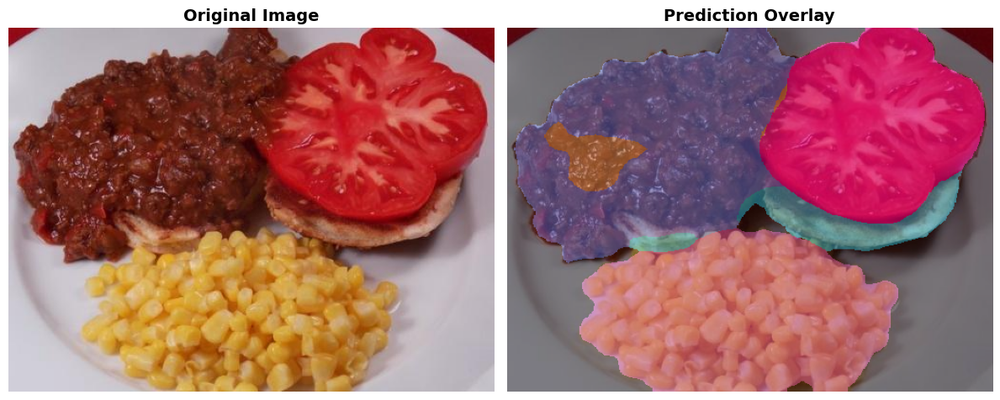


Image 5/5: 00005646.jpg
✓ Saved visualization to: result_5.png


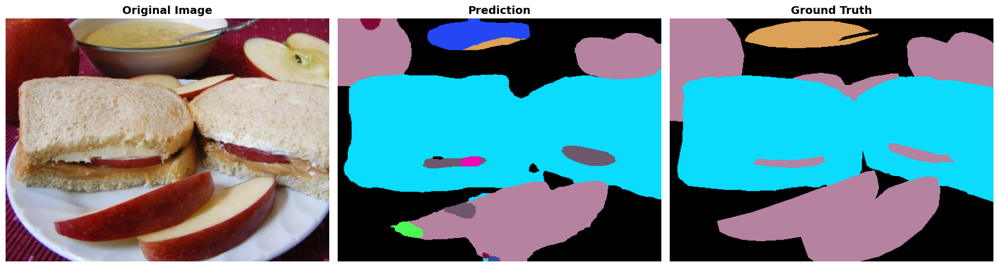

✓ Saved overlay to: overlay_5.png


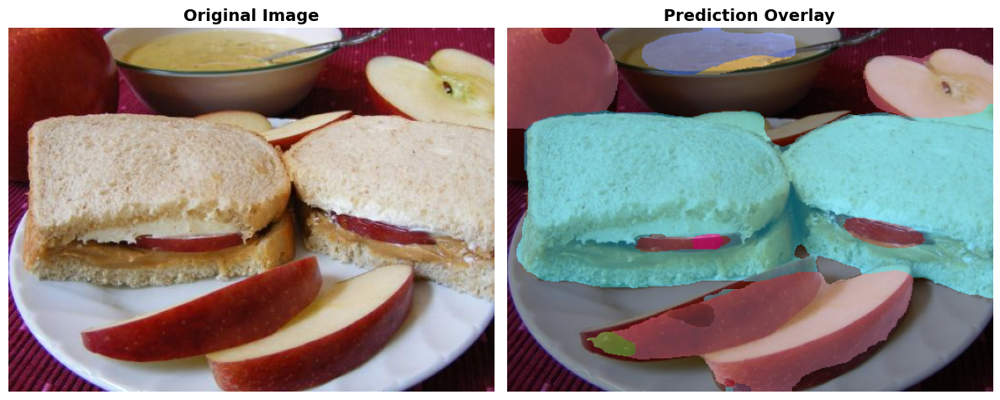



✅ TESTING COMPLETE!
Check the saved images:
  - result_1.png, result_2.png, ... (side-by-side comparison)
  - overlay_1.png, overlay_2.png, ... (prediction overlay)


In [5]:
"""
Test Your Trained Model on Images
Visualize predictions vs ground truth
"""

import torch
import torch.nn as nn
import torch.nn.functional as F
from torchvision import transforms
from torchvision.models import resnet50, ResNet50_Weights
from PIL import Image
import numpy as np
import matplotlib.pyplot as plt
import os
import random

# ============================================================================
# MODEL ARCHITECTURE (Must match your training code)
# ============================================================================

class FastASPP(nn.Module):
    def __init__(self, in_channels, out_channels):
        super().__init__()
        
        self.conv1 = nn.Sequential(
            nn.Conv2d(in_channels, out_channels, 1, bias=False),
            nn.BatchNorm2d(out_channels),
            nn.ReLU(inplace=True)
        )
        
        self.conv6 = nn.Sequential(
            nn.Conv2d(in_channels, in_channels, 3, padding=6, dilation=6, groups=in_channels, bias=False),
            nn.Conv2d(in_channels, out_channels, 1, bias=False),
            nn.BatchNorm2d(out_channels),
            nn.ReLU(inplace=True)
        )
        
        self.conv12 = nn.Sequential(
            nn.Conv2d(in_channels, in_channels, 3, padding=12, dilation=12, groups=in_channels, bias=False),
            nn.Conv2d(in_channels, out_channels, 1, bias=False),
            nn.BatchNorm2d(out_channels),
            nn.ReLU(inplace=True)
        )
        
        self.global_pool = nn.Sequential(
            nn.AdaptiveAvgPool2d(1),
            nn.Conv2d(in_channels, out_channels, 1, bias=False),
            nn.BatchNorm2d(out_channels),
            nn.ReLU(inplace=True)
        )
        
        self.fuse = nn.Sequential(
            nn.Conv2d(out_channels * 4, out_channels, 1, bias=False),
            nn.BatchNorm2d(out_channels),
            nn.ReLU(inplace=True),
            nn.Dropout2d(0.1)
        )
    
    def forward(self, x):
        size = x.shape[-2:]
        x1 = self.conv1(x)
        x6 = self.conv6(x)
        x12 = self.conv12(x)
        xg = F.interpolate(self.global_pool(x), size=size, mode='bilinear', align_corners=False)
        return self.fuse(torch.cat([x1, x6, x12, xg], dim=1))


class LightFPN(nn.Module):
    def __init__(self, in_channels_list, out_channels):
        super().__init__()
        self.lateral_convs = nn.ModuleList([
            nn.Conv2d(in_ch, out_channels, 1, bias=False)
            for in_ch in in_channels_list
        ])
    
    def forward(self, features):
        laterals = [conv(feat) for conv, feat in zip(self.lateral_convs, features)]
        for i in range(len(laterals) - 1, 0, -1):
            size = laterals[i-1].shape[-2:]
            laterals[i-1] = laterals[i-1] + F.interpolate(laterals[i], size=size, mode='nearest')
        return laterals


class UltimateDeepLab(nn.Module):
    def __init__(self, num_classes=104, dropout=0.15):
        super().__init__()
        
        weights = ResNet50_Weights.IMAGENET1K_V2
        backbone = resnet50(weights=weights)
        
        self.layer0 = nn.Sequential(backbone.conv1, backbone.bn1, backbone.relu, backbone.maxpool)
        self.layer1 = backbone.layer1
        self.layer2 = backbone.layer2
        self.layer3 = backbone.layer3
        self.layer4 = backbone.layer4
        
        self.fpn = LightFPN([512, 1024, 2048], 256)
        self.aspp = FastASPP(2048, 256)
        
        self.decoder = nn.Sequential(
            nn.Conv2d(256 * 4, 256, 3, padding=1, bias=False),
            nn.BatchNorm2d(256),
            nn.ReLU(inplace=True),
            nn.Dropout2d(dropout),
            nn.Conv2d(256, 128, 3, padding=1, bias=False),
            nn.BatchNorm2d(128),
            nn.ReLU(inplace=True),
            nn.Dropout2d(dropout),
            nn.Conv2d(128, num_classes, 1)
        )
        
        self.aux = nn.Sequential(
            nn.Conv2d(1024, 256, 3, padding=1, bias=False),
            nn.BatchNorm2d(256),
            nn.ReLU(inplace=True),
            nn.Dropout2d(dropout),
            nn.Conv2d(256, num_classes, 1)
        )
    
    def forward(self, x):
        input_size = x.shape[-2:]
        
        x = self.layer0(x)
        c1 = self.layer1(x)
        c2 = self.layer2(c1)
        c3 = self.layer3(c2)
        c4 = self.layer4(c3)
        
        fpn_features = self.fpn([c2, c3, c4])
        aspp_out = self.aspp(c4)
        
        target_size = fpn_features[0].shape[-2:]
        fpn_up = [F.interpolate(f, size=target_size, mode='bilinear', align_corners=False) 
                  for f in fpn_features]
        aspp_up = F.interpolate(aspp_out, size=target_size, mode='bilinear', align_corners=False)
        
        fused = torch.cat(fpn_up + [aspp_up], dim=1)
        out = self.decoder(fused)
        out = F.interpolate(out, size=input_size, mode='bilinear', align_corners=False)
        
        return {'out': out}

# ============================================================================
# LOAD MODEL
# ============================================================================

def load_model(checkpoint_path, device='cuda'):
    """Load trained model"""
    print(f"Loading model from: {checkpoint_path}")
    
    model = UltimateDeepLab(104, dropout=0.15).to(device)
    
    checkpoint = torch.load(checkpoint_path, map_location=device, weights_only=False)
    
    if isinstance(checkpoint, dict):
        if 'model' in checkpoint:
            model.load_state_dict(checkpoint['model'])
        elif 'model_state_dict' in checkpoint:
            model.load_state_dict(checkpoint['model_state_dict'])
        else:
            model.load_state_dict(checkpoint)
    else:
        model.load_state_dict(checkpoint)
    
    model.eval()
    print("✓ Model loaded successfully!")
    
    return model

# ============================================================================
# COLOR MAP FOR VISUALIZATION
# ============================================================================

def get_color_map(num_classes=104):
    """Generate colors for each class"""
    np.random.seed(42)
    colors = np.random.randint(0, 255, size=(num_classes, 3), dtype=np.uint8)
    colors[0] = [0, 0, 0]  # Background black
    return colors

# ============================================================================
# PREDICTION FUNCTION
# ============================================================================

def predict_image(model, image_path, device='cuda', img_size=416):
    """Predict segmentation for a single image"""
    
    # Load image
    image = Image.open(image_path).convert('RGB')
    original_size = image.size
    
    # Preprocess
    transform = transforms.Compose([
        transforms.Resize((img_size, img_size)),
        transforms.ToTensor(),
        transforms.Normalize(mean=[0.485, 0.456, 0.406], 
                           std=[0.229, 0.224, 0.225])
    ])
    
    input_tensor = transform(image).unsqueeze(0).to(device)
    
    # Predict
    with torch.no_grad():
        output = model(input_tensor)
        prediction = output['out'].argmax(1).squeeze(0).cpu().numpy()
    
    # Resize prediction to original size
    prediction = Image.fromarray(prediction.astype(np.uint8))
    prediction = prediction.resize(original_size, Image.NEAREST)
    prediction = np.array(prediction)
    
    return image, prediction

# ============================================================================
# VISUALIZATION
# ============================================================================

def visualize_results(image, prediction, ground_truth=None, save_path=None):
    """Visualize image, prediction, and optionally ground truth"""
    
    color_map = get_color_map()
    
    # Convert prediction to color
    pred_colored = color_map[prediction]
    
    if ground_truth is not None:
        # 3 columns: image, prediction, ground truth
        fig, axes = plt.subplots(1, 3, figsize=(18, 6))
        
        axes[0].imshow(image)
        axes[0].set_title('Original Image', fontsize=14, fontweight='bold')
        axes[0].axis('off')
        
        axes[1].imshow(pred_colored)
        axes[1].set_title('Prediction', fontsize=14, fontweight='bold')
        axes[1].axis('off')
        
        gt_colored = color_map[ground_truth]
        axes[2].imshow(gt_colored)
        axes[2].set_title('Ground Truth', fontsize=14, fontweight='bold')
        axes[2].axis('off')
    else:
        # 2 columns: image and prediction
        fig, axes = plt.subplots(1, 2, figsize=(12, 6))
        
        axes[0].imshow(image)
        axes[0].set_title('Original Image', fontsize=14, fontweight='bold')
        axes[0].axis('off')
        
        axes[1].imshow(pred_colored)
        axes[1].set_title('Prediction', fontsize=14, fontweight='bold')
        axes[1].axis('off')
    
    plt.tight_layout()
    
    if save_path:
        plt.savefig(save_path, bbox_inches='tight', dpi=150)
        print(f"✓ Saved visualization to: {save_path}")
    
    plt.show()

# ============================================================================
# OVERLAY VISUALIZATION
# ============================================================================

def visualize_overlay(image, prediction, alpha=0.5, save_path=None):
    """Show prediction overlaid on original image"""
    
    color_map = get_color_map()
    pred_colored = color_map[prediction]
    
    # Convert PIL to numpy if needed
    if isinstance(image, Image.Image):
        image_np = np.array(image)
    else:
        image_np = image
    
    # Blend
    overlay = (alpha * image_np + (1 - alpha) * pred_colored).astype(np.uint8)
    
    fig, axes = plt.subplots(1, 2, figsize=(12, 6))
    
    axes[0].imshow(image_np)
    axes[0].set_title('Original Image', fontsize=14, fontweight='bold')
    axes[0].axis('off')
    
    axes[1].imshow(overlay)
    axes[1].set_title('Prediction Overlay', fontsize=14, fontweight='bold')
    axes[1].axis('off')
    
    plt.tight_layout()
    
    if save_path:
        plt.savefig(save_path, bbox_inches='tight', dpi=150)
        print(f"✓ Saved overlay to: {save_path}")
    
    plt.show()

# ============================================================================
# TEST ON MULTIPLE IMAGES
# ============================================================================

def test_on_dataset(model, data_dir, num_samples=5, with_gt=True, device='cuda'):
    """Test on random images from dataset"""
    
    # Find image directory
    img_dir = os.path.join(data_dir, 'FoodSeg103', 'Images', 'img_dir', 'test')
    if not os.path.exists(img_dir):
        img_dir = os.path.join(data_dir, 'Images', 'img_dir', 'test')
    
    ann_dir = os.path.join(data_dir, 'FoodSeg103', 'Images', 'ann_dir', 'test')
    if not os.path.exists(ann_dir):
        ann_dir = os.path.join(data_dir, 'Images', 'ann_dir', 'test')
    
    # Get image files
    image_files = [f for f in os.listdir(img_dir) if f.endswith(('.jpg', '.png'))]
    
    # Random sample
    sample_files = random.sample(image_files, min(num_samples, len(image_files)))
    
    print(f"\nTesting on {len(sample_files)} random images...\n")
    
    for idx, img_file in enumerate(sample_files):
        print(f"{'='*60}")
        print(f"Image {idx+1}/{len(sample_files)}: {img_file}")
        print(f"{'='*60}")
        
        img_path = os.path.join(img_dir, img_file)
        
        # Predict
        image, prediction = predict_image(model, img_path, device)
        
        # Load ground truth if available
        ground_truth = None
        if with_gt:
            mask_file = img_file.replace('.jpg', '.png')
            mask_path = os.path.join(ann_dir, mask_file)
            if os.path.exists(mask_path):
                ground_truth = np.array(Image.open(mask_path))
        
        # Visualize
        visualize_results(image, prediction, ground_truth, 
                        save_path=f'result_{idx+1}.png')
        
        # Also show overlay
        visualize_overlay(image, prediction, alpha=0.6,
                        save_path=f'overlay_{idx+1}.png')
        
        print()

# ============================================================================
# MAIN
# ============================================================================

if __name__ == "__main__":
    
    # Configuration
    CHECKPOINT_PATH = 'best_ultimate_model.pth'  # Your trained model
    DATA_DIR = '/kaggle/input/foodseg103'        # Dataset path
    DEVICE = 'cuda' if torch.cuda.is_available() else 'cpu'
    NUM_SAMPLES = 5  # Number of test images to visualize
    
    print("="*60)
    print("TESTING MODEL ON IMAGES")
    print("="*60)
    print(f"Device: {DEVICE}")
    print(f"Checkpoint: {CHECKPOINT_PATH}")
    print(f"Data directory: {DATA_DIR}")
    print("="*60 + "\n")
    
    # Load model
    model = load_model(CHECKPOINT_PATH, DEVICE)
    
    # Test on dataset
    test_on_dataset(model, DATA_DIR, NUM_SAMPLES, with_gt=True, device=DEVICE)
    
    print("\n" + "="*60)
    print("✅ TESTING COMPLETE!")
    print("="*60)
    print(f"Check the saved images:")
    print("  - result_1.png, result_2.png, ... (side-by-side comparison)")
    print("  - overlay_1.png, overlay_2.png, ... (prediction overlay)")
    print("="*60)

TESTING MODEL
Device: cuda
Checkpoint: best_ultimate_model.pth
Loading model from: best_ultimate_model.pth
✓ Model loaded successfully!

Testing 5 images



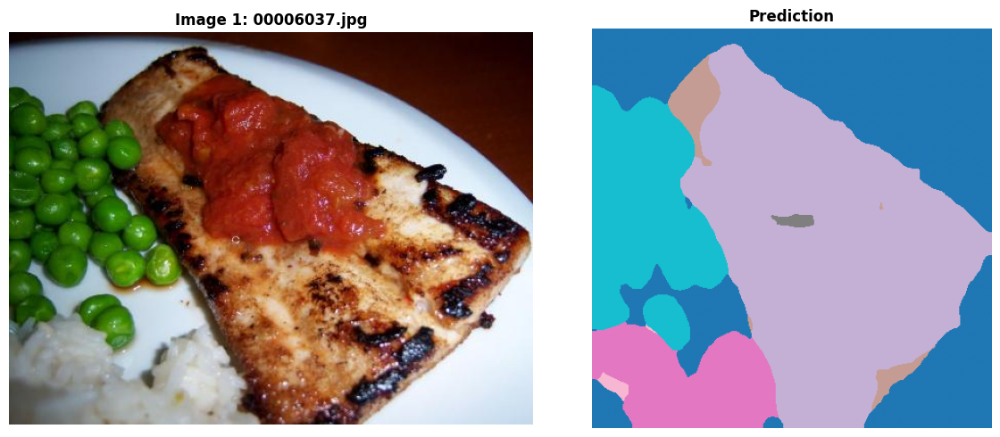

✓ Saved result_1.png


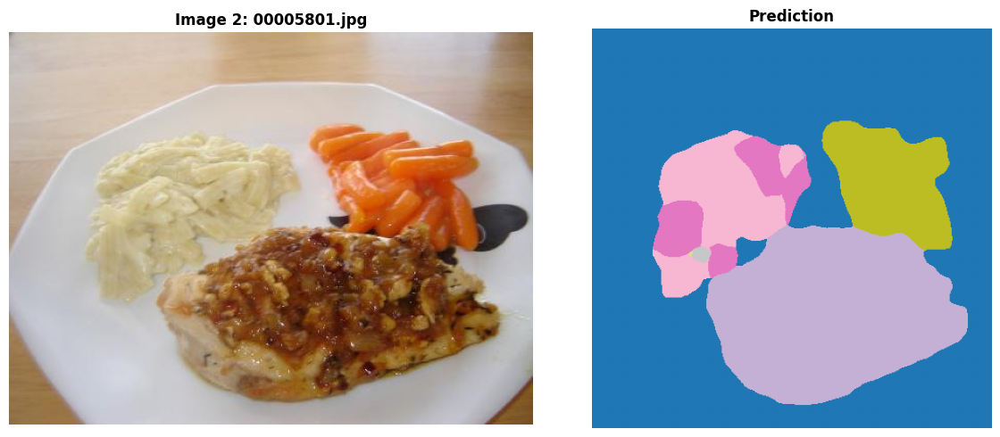

✓ Saved result_2.png


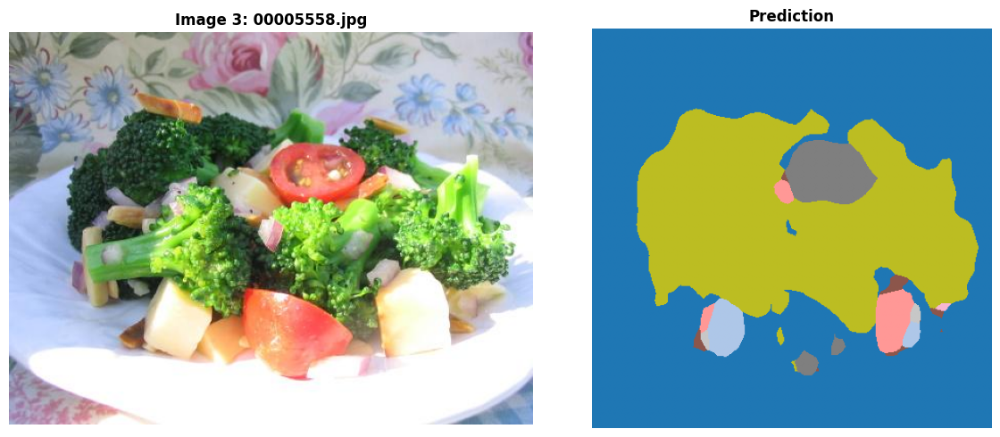

✓ Saved result_3.png


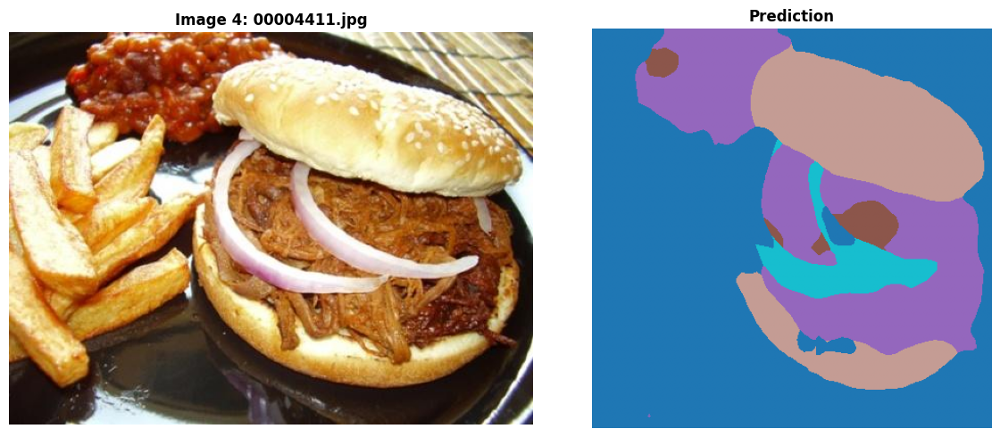

✓ Saved result_4.png


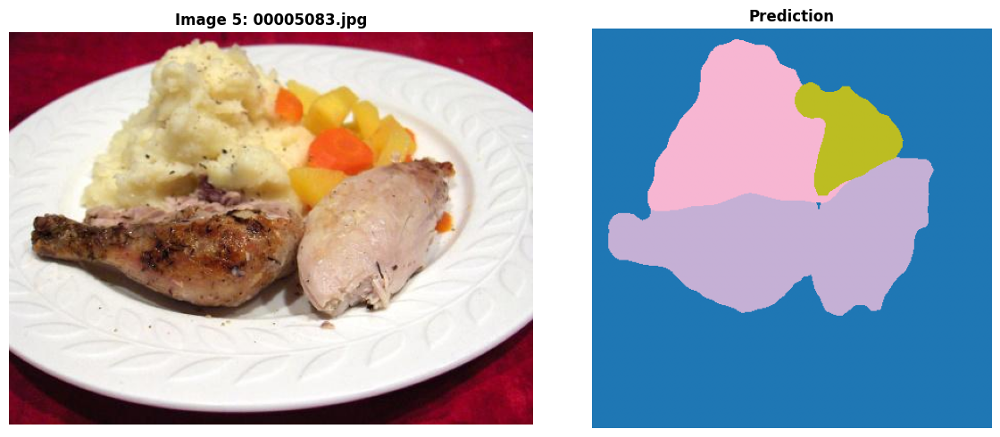

✓ Saved result_5.png

✅ All results saved!


✅ TESTING COMPLETE!


In [6]:
"""
Test Your Trained Model on Images
Visualize predictions vs ground truth
"""

import torch
import torch.nn as nn
import torch.nn.functional as F
from torchvision import transforms
from torchvision.models import resnet50, ResNet50_Weights
from PIL import Image
import numpy as np
import matplotlib.pyplot as plt
import os
import random

# ============================================================================
# MODEL ARCHITECTURE (Must match your training code)
# ============================================================================

class FastASPP(nn.Module):
    def __init__(self, in_channels, out_channels):
        super().__init__()
        
        self.conv1 = nn.Sequential(
            nn.Conv2d(in_channels, out_channels, 1, bias=False),
            nn.BatchNorm2d(out_channels),
            nn.ReLU(inplace=True)
        )
        
        self.conv6 = nn.Sequential(
            nn.Conv2d(in_channels, in_channels, 3, padding=6, dilation=6, groups=in_channels, bias=False),
            nn.Conv2d(in_channels, out_channels, 1, bias=False),
            nn.BatchNorm2d(out_channels),
            nn.ReLU(inplace=True)
        )
        
        self.conv12 = nn.Sequential(
            nn.Conv2d(in_channels, in_channels, 3, padding=12, dilation=12, groups=in_channels, bias=False),
            nn.Conv2d(in_channels, out_channels, 1, bias=False),
            nn.BatchNorm2d(out_channels),
            nn.ReLU(inplace=True)
        )
        
        self.global_pool = nn.Sequential(
            nn.AdaptiveAvgPool2d(1),
            nn.Conv2d(in_channels, out_channels, 1, bias=False),
            nn.BatchNorm2d(out_channels),
            nn.ReLU(inplace=True)
        )
        
        self.fuse = nn.Sequential(
            nn.Conv2d(out_channels * 4, out_channels, 1, bias=False),
            nn.BatchNorm2d(out_channels),
            nn.ReLU(inplace=True),
            nn.Dropout2d(0.1)
        )
    
    def forward(self, x):
        size = x.shape[-2:]
        x1 = self.conv1(x)
        x6 = self.conv6(x)
        x12 = self.conv12(x)
        xg = F.interpolate(self.global_pool(x), size=size, mode='bilinear', align_corners=False)
        return self.fuse(torch.cat([x1, x6, x12, xg], dim=1))


class LightFPN(nn.Module):
    def __init__(self, in_channels_list, out_channels):
        super().__init__()
        self.lateral_convs = nn.ModuleList([
            nn.Conv2d(in_ch, out_channels, 1, bias=False)
            for in_ch in in_channels_list
        ])
    
    def forward(self, features):
        laterals = [conv(feat) for conv, feat in zip(self.lateral_convs, features)]
        for i in range(len(laterals) - 1, 0, -1):
            size = laterals[i-1].shape[-2:]
            laterals[i-1] = laterals[i-1] + F.interpolate(laterals[i], size=size, mode='nearest')
        return laterals


class UltimateDeepLab(nn.Module):
    def __init__(self, num_classes=104, dropout=0.15):
        super().__init__()
        
        weights = ResNet50_Weights.IMAGENET1K_V2
        backbone = resnet50(weights=weights)
        
        self.layer0 = nn.Sequential(backbone.conv1, backbone.bn1, backbone.relu, backbone.maxpool)
        self.layer1 = backbone.layer1
        self.layer2 = backbone.layer2
        self.layer3 = backbone.layer3
        self.layer4 = backbone.layer4
        
        self.fpn = LightFPN([512, 1024, 2048], 256)
        self.aspp = FastASPP(2048, 256)
        
        self.decoder = nn.Sequential(
            nn.Conv2d(256 * 4, 256, 3, padding=1, bias=False),
            nn.BatchNorm2d(256),
            nn.ReLU(inplace=True),
            nn.Dropout2d(dropout),
            nn.Conv2d(256, 128, 3, padding=1, bias=False),
            nn.BatchNorm2d(128),
            nn.ReLU(inplace=True),
            nn.Dropout2d(dropout),
            nn.Conv2d(128, num_classes, 1)
        )
        
        self.aux = nn.Sequential(
            nn.Conv2d(1024, 256, 3, padding=1, bias=False),
            nn.BatchNorm2d(256),
            nn.ReLU(inplace=True),
            nn.Dropout2d(dropout),
            nn.Conv2d(256, num_classes, 1)
        )
    
    def forward(self, x):
        input_size = x.shape[-2:]
        
        x = self.layer0(x)
        c1 = self.layer1(x)
        c2 = self.layer2(c1)
        c3 = self.layer3(c2)
        c4 = self.layer4(c3)
        
        fpn_features = self.fpn([c2, c3, c4])
        aspp_out = self.aspp(c4)
        
        target_size = fpn_features[0].shape[-2:]
        fpn_up = [F.interpolate(f, size=target_size, mode='bilinear', align_corners=False) 
                  for f in fpn_features]
        aspp_up = F.interpolate(aspp_out, size=target_size, mode='bilinear', align_corners=False)
        
        fused = torch.cat(fpn_up + [aspp_up], dim=1)
        out = self.decoder(fused)
        out = F.interpolate(out, size=input_size, mode='bilinear', align_corners=False)
        
        return {'out': out}

# ============================================================================
# LOAD MODEL
# ============================================================================

def load_model(checkpoint_path, device='cuda'):
    """Load trained model"""
    print(f"Loading model from: {checkpoint_path}")
    
    model = UltimateDeepLab(104, dropout=0.15).to(device)
    
    checkpoint = torch.load(checkpoint_path, map_location=device, weights_only=False)
    
    if isinstance(checkpoint, dict):
        if 'model' in checkpoint:
            model.load_state_dict(checkpoint['model'])
        elif 'model_state_dict' in checkpoint:
            model.load_state_dict(checkpoint['model_state_dict'])
        else:
            model.load_state_dict(checkpoint)
    else:
        model.load_state_dict(checkpoint)
    
    model.eval()
    print("✓ Model loaded successfully!")
    
    return model

# ============================================================================
# COLOR MAP FOR VISUALIZATION
# ============================================================================

def get_color_map(num_classes=104):
    """Generate colors for each class"""
    np.random.seed(42)
    colors = np.random.randint(0, 255, size=(num_classes, 3), dtype=np.uint8)
    colors[0] = [0, 0, 0]  # Background black
    return colors

# ============================================================================
# PREDICTION FUNCTION
# ============================================================================

def predict_image(model, image_path, device='cuda', img_size=416):
    """Predict segmentation for a single image"""
    
    # Load image
    image = Image.open(image_path).convert('RGB')
    original_size = image.size
    
    # Preprocess
    transform = transforms.Compose([
        transforms.Resize((img_size, img_size)),
        transforms.ToTensor(),
        transforms.Normalize(mean=[0.485, 0.456, 0.406], 
                           std=[0.229, 0.224, 0.225])
    ])
    
    input_tensor = transform(image).unsqueeze(0).to(device)
    
    # Predict
    with torch.no_grad():
        output = model(input_tensor)
        prediction = output['out'].argmax(1).squeeze(0).cpu().numpy()
    
    # Resize prediction to original size
    prediction = Image.fromarray(prediction.astype(np.uint8))
    prediction = prediction.resize(original_size, Image.NEAREST)
    prediction = np.array(prediction)
    
    return image, prediction

# ============================================================================
# VISUALIZATION
# ============================================================================

def visualize_results(image, prediction, ground_truth=None, save_path=None):
    """Visualize image, prediction, and optionally ground truth"""
    
    color_map = get_color_map()
    
    # Convert prediction to color
    pred_colored = color_map[prediction]
    
    if ground_truth is not None:
        # 3 columns: image, prediction, ground truth
        fig, axes = plt.subplots(1, 3, figsize=(18, 6))
        
        axes[0].imshow(image)
        axes[0].set_title('Original Image', fontsize=14, fontweight='bold')
        axes[0].axis('off')
        
        axes[1].imshow(pred_colored)
        axes[1].set_title('Prediction', fontsize=14, fontweight='bold')
        axes[1].axis('off')
        
        gt_colored = color_map[ground_truth]
        axes[2].imshow(gt_colored)
        axes[2].set_title('Ground Truth', fontsize=14, fontweight='bold')
        axes[2].axis('off')
    else:
        # 2 columns: image and prediction
        fig, axes = plt.subplots(1, 2, figsize=(12, 6))
        
        axes[0].imshow(image)
        axes[0].set_title('Original Image', fontsize=14, fontweight='bold')
        axes[0].axis('off')
        
        axes[1].imshow(pred_colored)
        axes[1].set_title('Prediction', fontsize=14, fontweight='bold')
        axes[1].axis('off')
    
    plt.tight_layout()
    
    if save_path:
        plt.savefig(save_path, bbox_inches='tight', dpi=150)
        print(f"✓ Saved visualization to: {save_path}")
    
    plt.show()

# ============================================================================
# OVERLAY VISUALIZATION
# ============================================================================

def visualize_overlay(image, prediction, alpha=0.5, save_path=None):
    """Show prediction overlaid on original image"""
    
    color_map = get_color_map()
    pred_colored = color_map[prediction]
    
    # Convert PIL to numpy if needed
    if isinstance(image, Image.Image):
        image_np = np.array(image)
    else:
        image_np = image
    
    # Blend
    overlay = (alpha * image_np + (1 - alpha) * pred_colored).astype(np.uint8)
    
    fig, axes = plt.subplots(1, 2, figsize=(12, 6))
    
    axes[0].imshow(image_np)
    axes[0].set_title('Original Image', fontsize=14, fontweight='bold')
    axes[0].axis('off')
    
    axes[1].imshow(overlay)
    axes[1].set_title('Prediction Overlay', fontsize=14, fontweight='bold')
    axes[1].axis('off')
    
    plt.tight_layout()
    
    if save_path:
        plt.savefig(save_path, bbox_inches='tight', dpi=150)
        print(f"✓ Saved overlay to: {save_path}")
    
    plt.show()

# ============================================================================
# SIMPLE VISUALIZATION (Your Style)
# ============================================================================

def test_single_image_simple(model, image_path, device='cuda', img_size=416):
    """Simple test on one image - your style"""
    
    print(f"\n{'='*60}")
    print(f"Testing image: {image_path}")
    print(f"{'='*60}\n")
    
    # Load image
    image = Image.open(image_path).convert("RGB")
    
    # Transform
    transform = transforms.Compose([
        transforms.Resize((img_size, img_size)),
        transforms.ToTensor(),
        transforms.Normalize(mean=[0.485, 0.456, 0.406],
                           std=[0.229, 0.224, 0.225])
    ])
    
    input_tensor = transform(image).unsqueeze(0).to(device)
    
    # Inference
    with torch.no_grad():
        outputs = model(input_tensor)
        preds = outputs['out'].argmax(1).cpu().numpy()[0]  # [H, W]
    
    # Class names (FoodSeg103 categories)
    class_names = [
        "background", "candy", "egg tart", "french fries", "chocolate", 
        "biscuit", "popcorn", "pudding", "ice cream", "cheese butter",
        "cake", "wine", "milkshake", "coffee", "tea", "juice", "beer",
        "soup", "bread", "corn", "salad", "pie", "noodles", "other",
        # Add more as needed or use placeholder
    ] + [f"Class_{i}" for i in range(24, 104)]
    
    # Detected classes
    unique_classes = np.unique(preds[preds != 255])  # Ignore 255
    print("Classes detected in image:")
    for c in unique_classes:
        pixel_count = (preds == c).sum()
        percentage = (pixel_count / preds.size) * 100
        print(f"  - {c}: {class_names[c]} ({percentage:.1f}%)")
    
    # Visualization
    fig, ax = plt.subplots(1, 2, figsize=(14, 6))
    
    # Original image
    ax[0].imshow(image)
    ax[0].set_title("Original Image", fontsize=14, fontweight='bold')
    ax[0].axis("off")
    
    # Segmentation mask
    cmap = plt.get_cmap("tab20", 104)
    im = ax[1].imshow(preds, cmap=cmap, vmin=0, vmax=103)
    ax[1].set_title("Predicted Segmentation", fontsize=14, fontweight='bold')
    ax[1].axis("off")
    
    # Colorbar
    cbar = fig.colorbar(im, ax=ax, fraction=0.02, pad=0.04)
    if len(unique_classes) <= 10:  # Only show legend if not too many classes
        cbar.set_ticks(unique_classes)
        cbar.set_ticklabels([class_names[c] for c in unique_classes], fontsize=8)
    
    plt.tight_layout()
    plt.savefig('prediction_result.png', bbox_inches='tight', dpi=150)
    print(f"\n✓ Saved to: prediction_result.png")
    plt.show()
    
    return preds


def test_multiple_images_simple(model, data_dir, num_samples=5, device='cuda'):
    """Test multiple images - your style"""
    
    # Find test images
    img_dir = os.path.join(data_dir, 'FoodSeg103', 'Images', 'img_dir', 'test')
    if not os.path.exists(img_dir):
        img_dir = os.path.join(data_dir, 'Images', 'img_dir', 'test')
    
    image_files = [f for f in os.listdir(img_dir) if f.endswith(('.jpg', '.png'))]
    sample_files = random.sample(image_files, min(num_samples, len(image_files)))
    
    print(f"\n{'='*60}")
    print(f"Testing {len(sample_files)} images")
    print(f"{'='*60}\n")
    
    for idx, img_file in enumerate(sample_files, 1):
        img_path = os.path.join(img_dir, img_file)
        
        # Load image
        image = Image.open(img_path).convert("RGB")
        
        # Transform
        transform = transforms.Compose([
            transforms.Resize((416, 416)),
            transforms.ToTensor(),
            transforms.Normalize(mean=[0.485, 0.456, 0.406],
                               std=[0.229, 0.224, 0.225])
        ])
        
        input_tensor = transform(image).unsqueeze(0).to(device)
        
        # Inference
        with torch.no_grad():
            outputs = model(input_tensor)
            preds = outputs['out'].argmax(1).cpu().numpy()[0]
        
        # Visualization
        fig, ax = plt.subplots(1, 2, figsize=(12, 5))
        
        # Original
        ax[0].imshow(image)
        ax[0].set_title(f"Image {idx}: {img_file}", fontsize=12, fontweight='bold')
        ax[0].axis("off")
        
        # Prediction
        cmap = plt.get_cmap("tab20", 104)
        ax[1].imshow(preds, cmap=cmap, vmin=0, vmax=103)
        ax[1].set_title("Prediction", fontsize=12, fontweight='bold')
        ax[1].axis("off")
        
        plt.tight_layout()
        plt.savefig(f'result_{idx}.png', bbox_inches='tight', dpi=120)
        plt.show()
        
        print(f"✓ Saved result_{idx}.png")
    
    print(f"\n{'='*60}")
    print("✅ All results saved!")
    print(f"{'='*60}\n")

# ============================================================================
# MAIN
# ============================================================================

if __name__ == "__main__":
    
    # ====== Configuration ======
    CHECKPOINT_PATH = 'best_ultimate_model.pth'
    DATA_DIR = '/kaggle/input/foodseg103'
    DEVICE = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    
    print("="*60)
    print("TESTING MODEL")
    print("="*60)
    print(f"Device: {DEVICE}")
    print(f"Checkpoint: {CHECKPOINT_PATH}")
    print("="*60)
    
    # ====== Load model ======
    model = load_model(CHECKPOINT_PATH, DEVICE)
    
    # ====== OPTION 1: Test single image ======
    # Uncomment this if you have a specific image
    # test_single_image_simple(model, "sample.jpg", device=DEVICE)
    
    # ====== OPTION 2: Test multiple random images ======
    test_multiple_images_simple(model, DATA_DIR, num_samples=5, device=DEVICE)
    
    print("\n" + "="*60)
    print("✅ TESTING COMPLETE!")
    print("="*60)